# I. Introduction

Desa wisata Tajur merupakan satu dari sekian kampung yang ada di Desa Pasanggrahan, Purwakarta. Berdasarkan dari Jadesta, kategori desa wisata Tajur saat ini adalah desa wisata berkembang. Namun pihak desa Pasanggrahan merasa bahwa kondisi Kampung Tajur saat ini stagnan dari jumlah turis yang datang bahkan cenderung menurun. Selain itu Pihak Desa merasa tidak hanya kampung Tajur saja yang bisa dijadikan desa wisata, namun kampung lain juga diharapkan bisa untuk dijadikan desa wisata. Berdasarkan keinginan tersebut, aparatur Desa Pasanggrahan bersama masyarakat berusaha untuk mengembangkan kampung Tajur dan kampung sekitarnya. 

Untuk mengembangkan sebuah desa wisata dapat dilakukan dengan berbagai hal, salah satu yang bisa dilakukan adalah mengamati ulasan atau review dari turis terhadap desa wisata di situs ulasan. Umumnya turis akan berkata jujur saat memberikan di situs ulasan karena mereka merasa privacy mereka terjaga dan tidak akan berhubungan langsung dengan pihak destinasi. Dan para turis umumnya ingin agar orang lain juga mengetahui apa yang mereka rasakan selama mengunjungi desa wisata.

Dalam memberikan ulasan, turis umumnya terbagi menjadi 3 kelompok. Pertama adalah ulasan positif yaitu ketika turis merasakan experience yang menyenangkan selama mengunjungi dan mereka akan merekomendasikan destinasi. Kedua adalah ulasan netral yaitu turis merasakan kondisi yang biasa saja, tidak ada yang istimewa. Dan yang ketiga adalah ulasan negatif, yaitu turis merasakan pengalaman yang tidak menyenangkan dan akan merekomendasikan agar yang lain tidak datang ke destinasi tersebut. 

Harapannya dengan mengetahui 3 kelompok ulasan, Desa Pasanggrahan bisa mendapatkan gambaran keiinginan dari para turis agar bisa mendapatkan review positif dan  menghindari dari hal-hal yang bisa membuat turis mengalami pengalaman negatif dan memberikan ulasan negatif. 



# II. Metodologi

Untuk melakukan analisa ulasan dari situs ulasan, kami akan menggunakan tehnik Web Scraping dari situs ulasan terbesar yaitu TripAdvisor. Pada tahap awal kami akan melakukan pencarian dengan kata kunci Desa Wisata. Dari hasil yang didapat akan discrape untuk diambil nama destinasi, jumlah review, dan lokasi destinasi. 

Setelah didapatkan data tersebut dilakukan pengecekan kembali dan dilakukan query ulang untuk destinasi yang sesuai dengan desa wisata, mengeliminasi destinasi lain seperti hotel, rumah makan atau lainnya. Setelah didapatkan destinasi desa wisata, dilakukan pengurutan berdasarkan jumlah ulasan. Pada penelitian ini kami hanya mengambil berdasarkan 10 destinasi desa wisata dengan ulasan terbanyak. 

Ulasan tersebut kami ambil dan dikelompokan menjadi tiga kelompok yaitu positif, netral, dan negatif. Setiap ulasan pada awalnya akan memberikan rating dari 1 sampai dengan 5 bintang. Untuk kelompok positif adalah mereka yang memberikan rating 4 dan 5, kelompok netral adalah yang memberikan rating 3, dan kelompok negatif adalah yang memberikan rating dibawah 3.

Setelah dilakukan klasifikasi, dilanjutkan dengan menghitung kata yang paling sering disampaikan dalam ulasan disetiap kelompoknya. dari kata- kata tersebut dilakukan analisis dan akan dilakukan penjabaran dari hasil analisisnya. 

# III. Import Libraries ( Analysist)

In [205]:
# Import Libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize,sent_tokenize
from wordcloud import WordCloud,STOPWORDS
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
import re
from collections import Counter

# IV. Load data

Data set yang digunakan adalah hasil scraping dari website TripAdvisor dengan script terpisah dan disimpan dalam bentuk excel. 

In [206]:
pd.options.display.max_columns = None

In [207]:
# Load data
df = pd.read_excel('D:\Data Science\Desa Wisata TripAdvisor.xlsx')
df.head()

,Title,Review,Locations
0,Desa Wisata Nglinggo,3 ulasan,"Yogyakarta, Jawa, Indonesia"
1,Desa Wisata Bentenan,7 ulasan,"Kolongan Sender, Manado, Sulawesi Utara, Sulawesi, Indonesia"
2,Desa Sembungan,34 ulasan,"Wonosobo, Jawa Tengah, Jawa, Indonesia"
3,Desa Cibuntu,7 ulasan,"Desa Cibuntu, Kuningan Regency, West Java, Kuningan, Jawa Barat, Jawa, Indonesia"
4,Desa Wisata Sajuta Batu,3 ulasan,"Purwakarta, Jawa Barat, Jawa, Indonesia"


In [208]:
# Convert review columns into INT
df[['Review', 'ulas']] = df['Review'].str.split(' ', expand=True)
df.drop(columns=['ulas'], inplace=True)
df['Review'] = df['Review'].str.replace('.', '')
# Drop null values
df.dropna(inplace=True)
df['Review'] = df['Review'].astype(int)
df

,Title,Review,Locations
0,Desa Wisata Nglinggo,3,"Yogyakarta, Jawa, Indonesia"
1,Desa Wisata Bentenan,7,"Kolongan Sender, Manado, Sulawesi Utara, Sulawesi, Indonesia"
2,Desa Sembungan,34,"Wonosobo, Jawa Tengah, Jawa, Indonesia"
3,Desa Cibuntu,7,"Desa Cibuntu, Kuningan Regency, West Java, Kuningan, Jawa Barat, Jawa, Indonesia"
4,Desa Wisata Sajuta Batu,3,"Purwakarta, Jawa Barat, Jawa, Indonesia"
...,...,...,...
355,Taman Wisata Pulau Situ Gintung,28,"Jln. Kertamukti No. 20, Tangerang, Banten Province, Jawa, Indonesia"
356,Wisata Religi Buntu Burake,54,"Makale, Sulawesi Selatan, Sulawesi, Indonesia"
357,Wisata Rasa,31,"Jl. Genteng Besar no. 83A, Surabaya, Jawa Timur, Jawa, Indonesia"
358,Wisata Alam Pinus Pengger,164,"Bantul, Yogyakarta, Jawa, Indonesia"


Extract area from location

In [209]:
# Define the delimiter
delimiter = ", "

# Split the text column and reverse the order of split parts
df['tes'] = df['Locations'].str.split(delimiter).apply(lambda x: ', '.join(x[::-1]))

# Split the reverse
splitloc = df['tes'].str.split(delimiter, expand=True)

# Give the columns name
splitloc.columns = [f'Part_{i+1}' for i in range(9)]

# Concatenate the split columns with the original DataFrame
df = pd.concat([df, splitloc], axis=1)

# Rename split columns 
df.rename(columns={'Part_1':'Negara', 'Part_2':'Pulau', 'Part_3':'Provinsi','Part_4':'Kota'}, inplace=True)

#Drop not required columns
df.drop(['tes','Part_5', 'Part_6', 'Part_7', 'Part_8', 'Part_9'], axis=1, inplace=True)

#Reset index
df.reset_index(drop=True, inplace=True)



In [210]:
# Show 
df.sort_values(by='Review', ascending=False).head(30)

,Title,Review,Locations,Negara,Pulau,Provinsi,Kota
37,Teras Sawah Tegalalang,16859,"Jalan Raya Ceking, Tegalalang, Gianyar Regency, Bali, Indonesia",Indonesia,Bali,Gianyar Regency,Tegalalang
166,Pura Tanah Lot,11183,"Kecamatan Kediri, Kabupaten Tabanan, Beraban, Bali, Indonesia",Indonesia,Bali,Beraban,Kabupaten Tabanan
329,Pantai Kuta - Bali,10504,"Kuta, Kecamatan Kuta, Bali, Indonesia",Indonesia,Bali,Kecamatan Kuta,Kuta
162,Goa Gajah,5120,"Jl. Raya Goa Gajah, Ubud, Gianyar Regency, Bali, Indonesia",Indonesia,Bali,Gianyar Regency,Ubud
189,Air Terjun Tegenungan,4807,"Jl. Raya Tegenungan, Kemenuh, Ubud, Gianyar Regency, Bali, Indonesia",Indonesia,Bali,Gianyar Regency,Ubud
169,Royal Safari Garden Resort & Convention,4280,"Jl. Raya Puncak 601, Puncak, Jawa Barat, Jawa, Indonesia",Indonesia,Jawa,Jawa Barat,Puncak
112,Pura Ulun Danu Bratan,3872,"Jl. Raya Candi Kuning, Tabanan, Bali, Indonesia",Indonesia,Bali,Tabanan,Jl. Raya Candi Kuning
203,Pandawa Beach,3713,"Darmawangsa St., Kuta, Kecamatan Kuta, Bali, Indonesia",Indonesia,Bali,Kecamatan Kuta,Kuta
187,Pura Tirta Empul,3471,"Jl. Tirta, Manukaya, Tampaksiring, Gianyar Regency, Bali, Indonesia",Indonesia,Bali,Gianyar Regency,Tampaksiring
204,Kawah Ijen,2940,"Banyuwangi, Jawa Timur, Jawa, Indonesia",Indonesia,Jawa,Jawa Timur,Banyuwangi


In [211]:
desa = df.query('Title.str.contains("Desa|desa|DESA")')
desa = desa.drop(desa[desa.Title.str.contains("Cottage|Villa|Inn|Mulih|Restaurant|Hotel|Taman|Sego|Resort")].index)
desa.sort_values(by='Review', ascending=False).reset_index( drop=True)

,Title,Review,Locations,Negara,Pulau,Provinsi,Kota
0,Desa Tenganan Aga,534,"Jalan Raya Nyuh Tebel, Tenganan, Manggis, Bali, Indonesia",Indonesia,Bali,Manggis,Tenganan
1,Desa Penglipuran,472,"Bangli, Bali, Indonesia",Indonesia,Bali,Bangli,None
2,Desa Wae Rebo,299,"West Manggarai Highlands, Flores, Nusa Tenggara Timur, Indonesia",Indonesia,Nusa Tenggara Timur,Flores,West Manggarai Highlands
3,Desa Tenun Tradisional Sade,186,"Rembitan, Sade, Lombok, Nusa Tenggara Barat, Indonesia",Indonesia,Nusa Tenggara Barat,Lombok,Sade
4,Desa Rammang-Rammang,184,"Dusun Rammang-Rammang Desa Salenrang, Maros, Sulawesi Selatan, Sulawesi, Indonesia",Indonesia,Sulawesi,Sulawesi Selatan,Maros
5,Desa Celuk Bali,144,"Jalan Raya Celuk, Sukawati, Gianyar Regency, Bali, Indonesia",Indonesia,Bali,Gianyar Regency,Sukawati
6,Desa Wisata Sembalun,144,"Sembalun, Lombok, Nusa Tenggara Barat, Indonesia",Indonesia,Nusa Tenggara Barat,Lombok,Sembalun
7,Desa Sukarara,126,"Lombok, Nusa Tenggara Barat, Indonesia",Indonesia,Nusa Tenggara Barat,Lombok,None
8,Desa Tomok,74,"Samosir, Sumatera Utara, Sumatra, Indonesia",Indonesia,Sumatra,Sumatera Utara,Samosir
9,Desa Wisata Kasongan,48,"Bangunjiwo , Bantul, Yogyakarta, Jawa, Indonesia",Indonesia,Jawa,Yogyakarta,Bantul


In [212]:
#load dataset for top 10 reviews

celuk = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Celuk.xlsx')
celuk['Desa'] = 'Celuk'
kasongan = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Kasongan.xlsx')
kasongan['Desa'] = 'Kasongan'
penglipuran = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Penglipuran.xlsx')
penglipuran['Desa'] = 'Penglipuran'
rammang = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Rammang.xlsx')
rammang['Desa'] = 'Rammang'
sade = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Sade.xlsx')
sade['Desa'] = 'Sade'
sembalun = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Sembalun.xlsx')
sembalun['Desa'] = 'Sembalun'
sukarara = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Sukarara.xlsx')
sukarara['Desa'] = 'Sukarara'
tenangan = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Tenangan.xlsx')
tenangan['Desa'] = 'Tenangan'
tomok = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Tomok.xlsx')
tomok['Desa'] = 'Tomok'
waerebo = pd.read_excel('D:\Data Science\Desawisata Reviews\Desa Waerebo.xlsx')
waerebo['Desa'] = 'Waerebo'

In [213]:
desa_wisata = pd.concat([celuk,kasongan,penglipuran,rammang,sade,sembalun,sukarara,tenangan,tomok,waerebo])
desa_wisata.reset_index(drop=True, inplace=True)
desa_wisata

,Title,Date,Rating,Review,Desa
0,SMILEY FAMILY TOUR,Sep 2018 • Bisnis,"5,0 dari 5 lingkaran",Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat peehiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong,Celuk
1,Desa wisata kerajinan emas dan perak,Jan 2018 • Teman,"5,0 dari 5 lingkaran",Tempat yang direkomendasikan bagi yang ini mencari souvenir terbuat dari emas dan perak dengan bentuk dan kualitas beragam. Tempat ini juga dapat terlibat langsung dalam pembuatannya karena dibuka kelas pembuatan souvenir bagi para wisatawan yang berminat,Celuk
2,Desanya Pengrajin emas & Perak,Jul 2016,"4,0 dari 5 lingkaran","Kami hanya sebentar mengunjungi beberapa pengrajin perak dan emas disini, sayang gak berfoto didalam showroomnya, hanya saat pulang saja... kerajinan perak dan emasnya sangat bagus, saya membeli beberapa .dan pengrajinnya membuat diluar menjadi bahan edukasi untuk anak-anak",Celuk
3,Artistic,Jul 2015 • Bisnis,"3,0 dari 5 lingkaran","Di desa ini kita akan menemui pengrajin perak dengan kreasi mereka yang artistik dan tentunya handmade, detail-detail pernak pernik yang dibuat dengan sangat teliti, sangat bagus untuk jadi oleh-oleh..",Celuk
4,Kampung Seniman Perak,Sep 2015,"4,0 dari 5 lingkaran","Desa Celuk terletak di Kabupaten Gianyar, berjarak 15 menit dari Pasar Seni Sukawati. Di sini terdapat banyak toko-toko kerajinan perak. Perak yang dijual disini pada umumnya bergaya Bali, atau sedikit modern dari bahan sterling silver. Kita dapat memesan perhiasan emas/perak disini dengan harga yang relatif terjangkau. Layak untuk berbelanja di sini dan menghargai seniman lokal.",Celuk
...,...,...,...,...,...
965,Ajaib village...,NaN,"4,0 dari 5 lingkaran","Saya pergi ke sana dengan teman-teman saya... sudah beberapa lama saya telah hiking... tapi setelah anda akan sampai di desa... anda akan takjub dengan pemandangan... mereka memiliki unik house, itu tampak sangat kecil dari luar tetapi ketika anda berada di dalam rumah benar-benar luas... cukup besar saya pikir... desa sangat welcome dengan turis... tapi saya mendapatkan memengkalkan dengan anak-anak mereka, di bagaimanapun mereka minta permen sangat sering... leader dari pemandu wisata kami mengatakan jika anda ingin memberi sesuatu tolong berikan ke 'ibu-ibu' yang menyiapkan akomodasi kami karena jika kami memberikan langsung ke anak-anak kemudian setiap kali ada tourist anak-anak akan berpikir mereka dapat meminta turis dan kami (turis) mengajar mereka untuk meminta... tapi sisi bahwa saya telah benar-benar hebat waktu di sana... pemandangan yang bagus... cuaca baik...",Waerebo
966,Unik tapi terbatas pengalaman budaya,Nov 2014 • Sendiri,"3,0 dari 5 lingkaran","Pertama-tama tempat ini cukup sulit. Saya adalah pada sepeda motor dan datang dari Lembor. Jalan untuk Dintor benar-benar kering di suatu tempat sepanjang pantai. Saya diarungi 3 sungai dan mengambil sepeda di atas bukit pasir dan kemudian beberapa km dari kerikil kasar (tidak ada aspal). Sebuah petualangan menyenangkan tapi tidak mudah. Saya mengambil rute alternatif keluar - yang 3-4 jam perjalanan di atas jalan ke ruteng yang berlubang besar. Ini semua bisa dilakukan, tapi tahu apa yang diharapkan. Pada saat kedatangan di Kombo/Denge anda akan kemudian memiliki 2-4 jam perjalanan melalui hutan lebat dan curam sisi bukit. Penduduk desa mereka sendiri membuat perjalanan ini beberapa kali sehari tapi itu adalah usaha.Pengaturan ini menakjubkan dan rumah konstruksi menarik. Anda harus pergi melalui upacara yang ramah - yang terdengar lebih menggairahkan dan romantis dari yang sebenarnya. Itu adalah di atas dalam beberapa menit dan tidak ada real japanese garden. Panduan saya berbicara sangat sedikit inggris dan ini adalah faktor yang membatasi di seluruh. Dengan tidak ada orang untuk menerjemahkan dan tidak ada penjelasan ada sedikit lain untuk melakukan di sini setelah anda telah mengambil gambar selain berbicara dengan wisatawan lain. Menurut satu yang berbicara bebe

In [214]:
# Convert review columns into INT
desa_wisata.Date.fillna('Jan 2018',inplace=True)
desa_wisata[['Rating', '1','2','3']] = desa_wisata['Rating'].str.split(' ', expand=True)
desa_wisata.drop(columns=['1','2','3'], inplace=True)
desa_wisata['Rating'] = desa_wisata['Rating'].str.replace(',', '.')
desa_wisata['Rating'] = desa_wisata['Rating'].astype(float)
desa_wisata[['Bulan', 'Tahun','2','Tipe User']] = desa_wisata['Date'].str.split(' ', expand=True)
desa_wisata['Tahun'] = desa_wisata.Tahun.astype(int)
desa_wisata.drop(columns=['2'], inplace=True)
desa_wisata

,Title,Date,Rating,Review,Desa,Bulan,Tahun,Tipe User
0,SMILEY FAMILY TOUR,Sep 2018 • Bisnis,5.0,Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat peehiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong,Celuk,Sep,2018,Bisnis
1,Desa wisata kerajinan emas dan perak,Jan 2018 • Teman,5.0,Tempat yang direkomendasikan bagi yang ini mencari souvenir terbuat dari emas dan perak dengan bentuk dan kualitas beragam. Tempat ini juga dapat terlibat langsung dalam pembuatannya karena dibuka kelas pembuatan souvenir bagi para wisatawan yang berminat,Celuk,Jan,2018,Teman
2,Desanya Pengrajin emas & Perak,Jul 2016,4.0,"Kami hanya sebentar mengunjungi beberapa pengrajin perak dan emas disini, sayang gak berfoto didalam showroomnya, hanya saat pulang saja... kerajinan perak dan emasnya sangat bagus, saya membeli beberapa .dan pengrajinnya membuat diluar menjadi bahan edukasi untuk anak-anak",Celuk,Jul,2016,None
3,Artistic,Jul 2015 • Bisnis,3.0,"Di desa ini kita akan menemui pengrajin perak dengan kreasi mereka yang artistik dan tentunya handmade, detail-detail pernak pernik yang dibuat dengan sangat teliti, sangat bagus untuk jadi oleh-oleh..",Celuk,Jul,2015,Bisnis
4,Kampung Seniman Perak,Sep 2015,4.0,"Desa Celuk terletak di Kabupaten Gianyar, berjarak 15 menit dari Pasar Seni Sukawati. Di sini terdapat banyak toko-toko kerajinan perak. Perak yang dijual disini pada umumnya bergaya Bali, atau sedikit modern dari bahan sterling silver. Kita dapat memesan perhiasan emas/perak disini dengan harga yang relatif terjangkau. Layak untuk berbelanja di sini dan menghargai seniman lokal.",Celuk,Sep,2015,None
...,...,...,...,...,...,...,...,...
965,Ajaib village...,Jan 2018,4.0,"Saya pergi ke sana dengan teman-teman saya... sudah beberapa lama saya telah hiking... tapi setelah anda akan sampai di desa... anda akan takjub dengan pemandangan... mereka memiliki unik house, itu tampak sangat kecil dari luar tetapi ketika anda berada di dalam rumah benar-benar luas... cukup besar saya pikir... desa sangat welcome dengan turis... tapi saya mendapatkan memengkalkan dengan anak-anak mereka, di bagaimanapun mereka minta permen sangat sering... leader dari pemandu wisata kami mengatakan jika anda ingin memberi sesuatu tolong berikan ke 'ibu-ibu' yang menyiapkan akomodasi kami karena jika kami memberikan langsung ke anak-anak kemudian setiap kali ada tourist anak-anak akan berpikir mereka dapat meminta turis dan kami (turis) mengajar mereka untuk meminta... tapi sisi bahwa saya telah benar-benar hebat waktu di sana... pemandangan yang bagus... cuaca baik...",Waerebo,Jan,2018,None
966,Unik tapi terbatas pengalaman budaya,Nov 2014 • Sendiri,3.0,"Pertama-tama tempat ini cukup sulit. Saya adalah pada sepeda motor dan datang dari Lembor. Jalan untuk Dintor benar-benar kering di suatu tempat sepanjang pantai. Saya diarungi 3 sungai dan mengambil sepeda di atas bukit pasir dan kemudian beberapa km dari kerikil kasar (tidak ada aspal). Sebuah petualangan menyenangkan tapi tidak mudah. Saya mengambil rute alternatif keluar - yang 3-4 jam perjalanan di atas jalan ke ruteng yang berlubang besar. Ini semua bisa dilakukan, tapi tahu apa yang diharapkan. Pada saat kedatangan di Kombo/Denge anda akan kemudian memiliki 2-4 jam perjalanan melalui hutan lebat dan curam sisi bukit. Penduduk desa mereka sendiri membuat perjalanan ini beberapa kali sehari tapi itu adalah usaha.Pengaturan ini menakjubkan dan rumah konstruksi menarik. Anda harus pergi melalui upacara yang ramah - yang terdengar lebih menggairahkan dan romantis dari yang sebenarnya. Itu adalah di atas dalam beberapa menit dan tidak ada real japanese garden. Panduan saya berbicara sangat sedikit inggris dan ini adalah faktor yang membatasi di seluruh. Dengan tidak ada orang untuk menerjemahkan dan tidak ada penjelasan ada sedikit lain untuk melakukan di sini setelah anda telah mengambil gambar selain berbicara dengan wisatawan lain. Menurut satu yang berbicara beberapa 

In [215]:
desa_wisata.isna().sum()

Title          0
Date           0
Rating         0
Review         0
Desa           0
Bulan          0
Tahun          0
Tipe User    138
dtype: int64

In [216]:
desa_wisata.fillna('Sendiri',inplace = True)

In [217]:
# replace 'peehiasan' with 'perhiasan'
desa_wisata['Review'] = desa_wisata['Review'].str.replace('peehiasan', 'perhiasan')

# V. Exploratory Data

In [218]:
# Check
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339 entries, 0 to 338
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Title      339 non-null    object
 1   Review     339 non-null    int32 
 2   Locations  339 non-null    object
 3   Negara     339 non-null    object
 4   Pulau      339 non-null    object
 5   Provinsi   339 non-null    object
 6   Kota       324 non-null    object
dtypes: int32(1), object(6)
memory usage: 17.3+ KB


In [219]:
# Function to visualize columns categoric numeric
def diagnostic_plots(df):
    # Barplot

    fig, ax=plt.subplots(figsize=(10,5))
    sns.barplot(x=df.value_counts().index, y=df.value_counts())
    plt.xticks(rotation='vertical')
    plt.title('Barplot')
    plt.show()
    print('Jumlah : \n', df.value_counts().sort_index())
    print('Percentage : \n', (df.value_counts().sort_index())/(df.shape[0]) * 100)

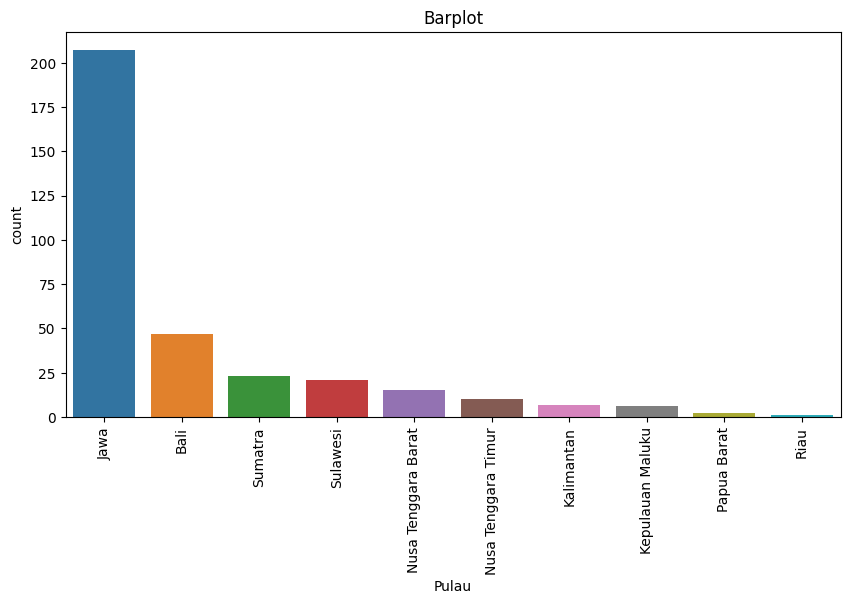

Jumlah : 
 Pulau
Bali                    47
Jawa                   207
Kalimantan               7
Kepulauan Maluku         6
Nusa Tenggara Barat     15
Nusa Tenggara Timur     10
Papua Barat              2
Riau                     1
Sulawesi                21
Sumatra                 23
Name: count, dtype: int64
Percentage : 
 Pulau
Bali                   13.864307
Jawa                   61.061947
Kalimantan              2.064897
Kepulauan Maluku        1.769912
Nusa Tenggara Barat     4.424779
Nusa Tenggara Timur     2.949853
Papua Barat             0.589971
Riau                    0.294985
Sulawesi                6.194690
Sumatra                 6.784661
Name: count, dtype: float64


In [220]:
# Visualize Categoric columns numeric discrete (int type)

diagnostic_plots(df['Pulau'])

In [221]:
desa.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43 entries, 0 to 331
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Title      43 non-null     object
 1   Review     43 non-null     int32 
 2   Locations  43 non-null     object
 3   Negara     43 non-null     object
 4   Pulau      43 non-null     object
 5   Provinsi   43 non-null     object
 6   Kota       38 non-null     object
dtypes: int32(1), object(6)
memory usage: 2.5+ KB


Bedasarkan pengamatan dari hasil Web Scraping dari website TripAdvisor dengan Keyword Desa Wisata Indonesia, terdapat 339 destinasi yang muncul. Dari 339 Destinasi tersebut 61% berada di Pulau Jawa, kemudian Bali 13.86 % dan tersedikit di pulau Papua Barat sekitar 0.6% atau hanya 2 Destinasi Wisata.

Dari 339 destinasi wisata, mayoritas adalah bukan desa wisata, data tersebut masih tercampur dengan attraction lain. Sehingga dilakukan query ulang dengan keyword Desa dan didapatkan 43 Destinasi Desa Wisata. Selanjutnya dari 10 desa dengan terbanyak ulasan diambil ulasannya dan dijadikan satu dataframe. 

In [222]:
desa_wisata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970 entries, 0 to 969
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Title      970 non-null    object 
 1   Date       970 non-null    object 
 2   Rating     970 non-null    float64
 3   Review     970 non-null    object 
 4   Desa       970 non-null    object 
 5   Bulan      970 non-null    object 
 6   Tahun      970 non-null    int32  
 7   Tipe User  970 non-null    object 
dtypes: float64(1), int32(1), object(6)
memory usage: 57.0+ KB


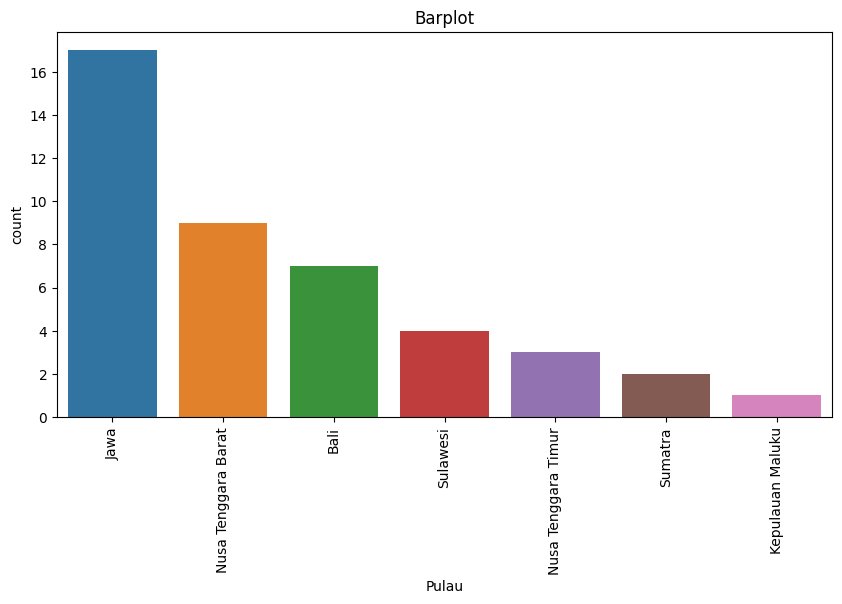

Jumlah : 
 Pulau
Bali                    7
Jawa                   17
Kepulauan Maluku        1
Nusa Tenggara Barat     9
Nusa Tenggara Timur     3
Sulawesi                4
Sumatra                 2
Name: count, dtype: int64
Percentage : 
 Pulau
Bali                   16.279070
Jawa                   39.534884
Kepulauan Maluku        2.325581
Nusa Tenggara Barat    20.930233
Nusa Tenggara Timur     6.976744
Sulawesi                9.302326
Sumatra                 4.651163
Name: count, dtype: float64


In [223]:
# Visualize Categoric columns numeric discrete (int type)

diagnostic_plots(desa['Pulau'])

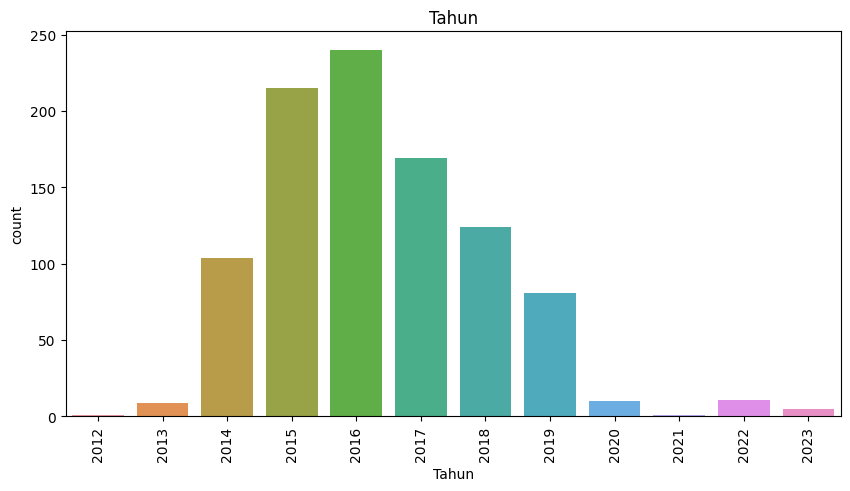

In [224]:
fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(x=desa_wisata['Tahun'].value_counts().index, y=desa_wisata['Tahun'].value_counts())
plt.xticks(rotation='vertical')
plt.title('Tahun')
plt.show()

In [225]:
fig = px.bar(desa_wisata, x="Desa", y=desa_wisata.Tahun.sort_index(),
              barmode='group',
             height=400)
fig.show()

In [226]:

fig = px.bar(desa_wisata, x=desa_wisata.Tahun.sort_index(), y=desa_wisata.Tahun.index)
fig.show()

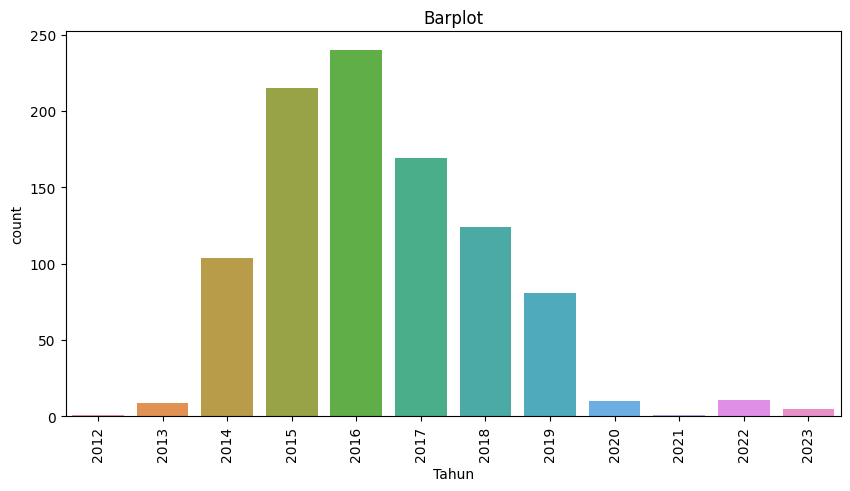

Jumlah : 
 Tahun
2012      1
2013      9
2014    104
2015    215
2016    240
2017    169
2018    124
2019     81
2020     10
2021      1
2022     11
2023      5
Name: count, dtype: int64
Percentage : 
 Tahun
2012     0.103093
2013     0.927835
2014    10.721649
2015    22.164948
2016    24.742268
2017    17.422680
2018    12.783505
2019     8.350515
2020     1.030928
2021     0.103093
2022     1.134021
2023     0.515464
Name: count, dtype: float64


In [227]:
# Visualize Categoric columns numeric discrete (int type)

diagnostic_plots(desa_wisata['Tahun'])

In [228]:
desa_wisata.groupby('Desa').Rating.mean().round(1)

Desa
Celuk          3.4
Kasongan       4.1
Penglipuran    4.4
Rammang        4.4
Sade           3.8
Sembalun       4.5
Sukarara       4.0
Tenangan       3.6
Tomok          4.0
Waerebo        4.6
Name: Rating, dtype: float64

In [229]:
# Create function classification rating 

def rate(x):
  if x >= 4:
    return 'Positif'
  if x <4 and x>=3 :
    return 'Neutral'
  else:
    return 'Negatif'
  
  # Create function classification 

def classify(x):
  if x == 'Positif':
    return 2
  if x == 'Neutral' :
    return 1
  else:
    return 0

In [230]:
# Apply function to convert rating into 3 groups
desa_wisata['Sentiment'] = desa_wisata['Rating'].apply(rate)
desa_wisata['Sentiment_class'] = desa_wisata['Sentiment'].apply(classify)

In [231]:
desa_wisata['Sentiment'].value_counts().index

Index(['Positif', 'Neutral', 'Negatif'], dtype='object', name='Sentiment')

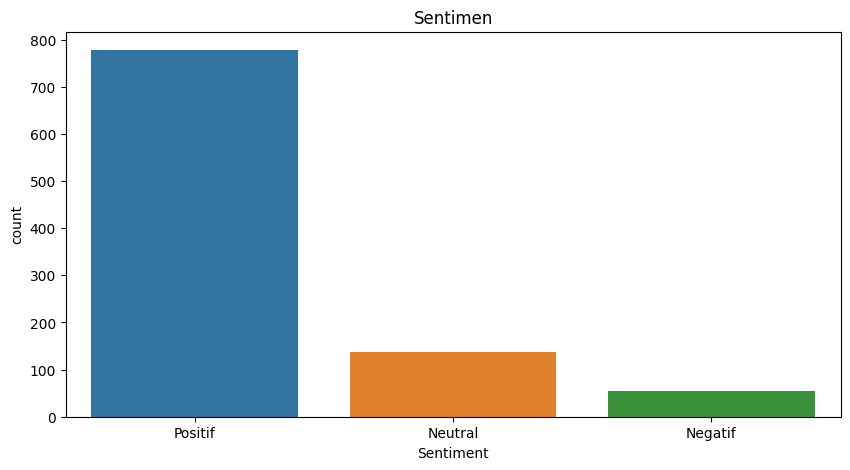

Jumlah : 
 Sentiment
Negatif     54
Neutral    138
Positif    778
Name: count, dtype: int64
Percentage : 
 Sentiment
Negatif     5.567010
Neutral    14.226804
Positif    80.206186
Name: count, dtype: float64


In [232]:
# Check barplot sentimen

fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(x=desa_wisata['Sentiment'].value_counts().index, y=desa_wisata['Sentiment'].value_counts())
plt.xticks(rotation='horizontal')
plt.title('Sentimen')
plt.show()
print('Jumlah : \n', desa_wisata['Sentiment'].value_counts().sort_index())
print('Percentage : \n', (desa_wisata['Sentiment'].value_counts().sort_index())/(desa_wisata.shape[0]) * 100)

In [233]:
desa_wisata.groupby(['Sentiment','Tipe User']).Sentiment.count()

Sentiment  Tipe User
Negatif    Keluarga      13
           Pasangan      27
           Sendiri        9
           Teman          5
Neutral    Bisnis         8
           Keluarga      20
           Pasangan      43
           Sendiri       31
           Teman         36
Positif    Bisnis        49
           Keluarga     147
           Pasangan     150
           Sendiri      184
           Teman        248
Name: Sentiment, dtype: int64

In [234]:
pos.sort_values

<bound method Series.sort_values of Tipe User
Bisnis       49
Keluarga    147
Pasangan    150
Sendiri     184
Teman       248
Name: Sentiment, dtype: int64>

In [235]:
# Function to visualize columns numeric discrete
def diagnos_plots(df,sen):
    # Barplot

    fig, ax=plt.subplots(figsize=(10,5))
    sns.barplot(x=df.index, y=df, order= df.sort_values().index)
    plt.xticks(rotation='horizontal')
    plt.title(sen)


    plt.show()

In [236]:
# group by Desa Wisata per sentiment
posdes = desa_wisata[desa_wisata.Sentiment =='Positif'].groupby(['Desa']).Sentiment.count()
netdes = desa_wisata[desa_wisata.Sentiment =='Neutral'].groupby(['Desa']).Sentiment.count()
negdes = desa_wisata[desa_wisata.Sentiment =='Negatif'].groupby(['Desa']).Sentiment.count()

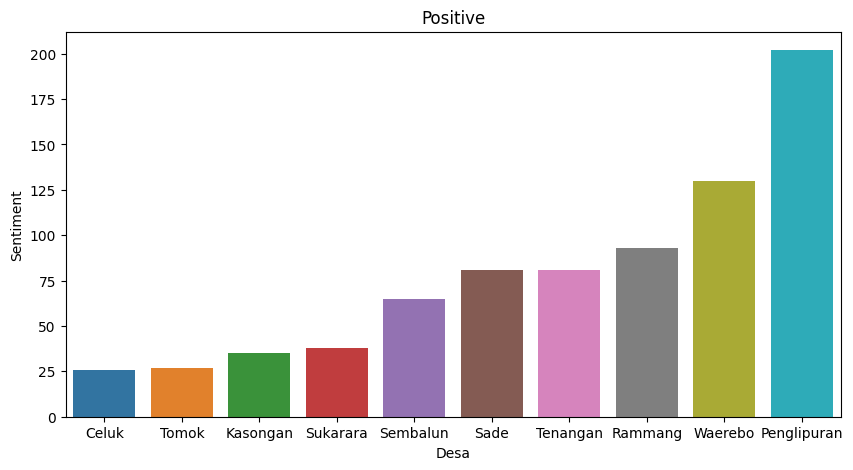

In [237]:
# Positif
diagnos_plots(posdes, 'Positive')

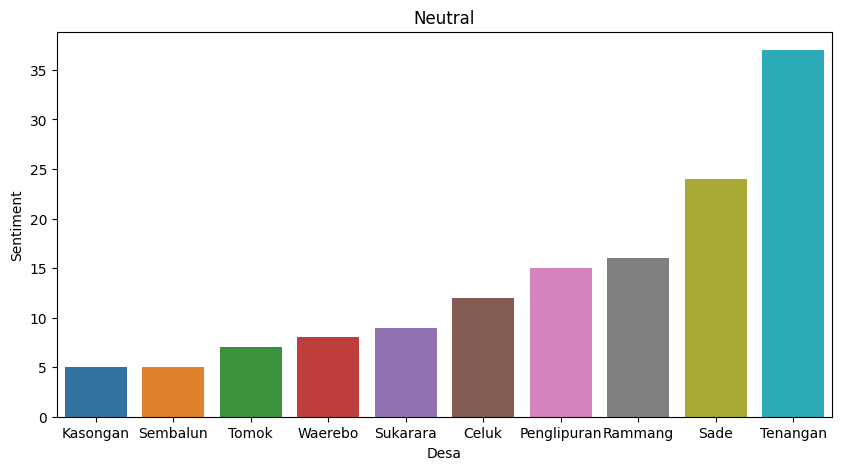

In [238]:
# Netral Desa 
diagnos_plots(netdes, 'Neutral')

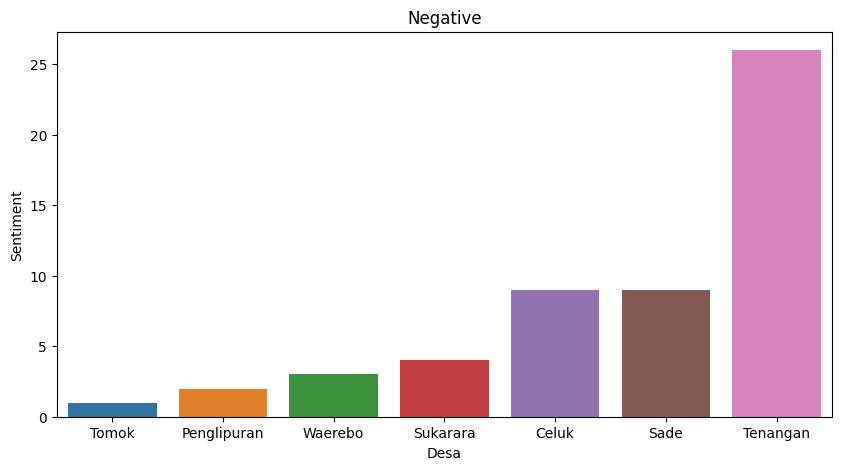

In [239]:
# Negatif Desa
diagnos_plots(negdes, 'Negative')

In [240]:
# group by tipe user per sentiment
pos = desa_wisata[desa_wisata.Sentiment =='Positif'].groupby(['Tipe User']).Sentiment.count()
net = desa_wisata[desa_wisata.Sentiment =='Neutral'].groupby(['Tipe User']).Sentiment.count()
neg = desa_wisata[desa_wisata.Sentiment =='Negatif'].groupby(['Tipe User']).Sentiment.count()

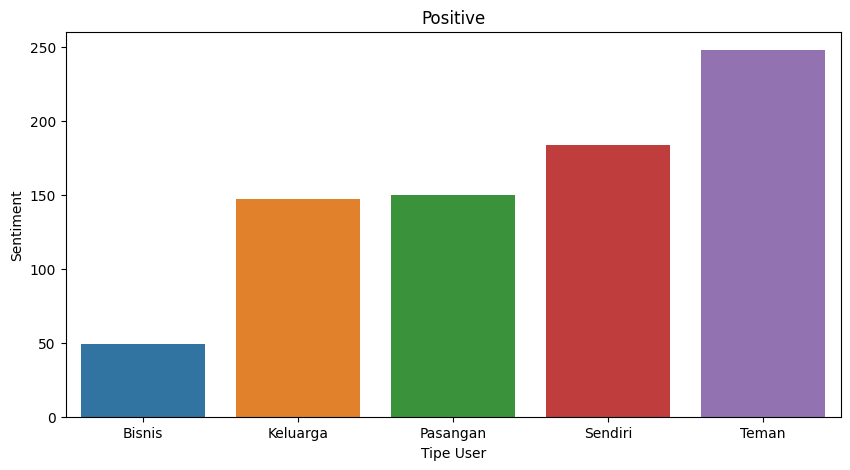

In [241]:
# Positif
diagnos_plots(pos, 'Positive')

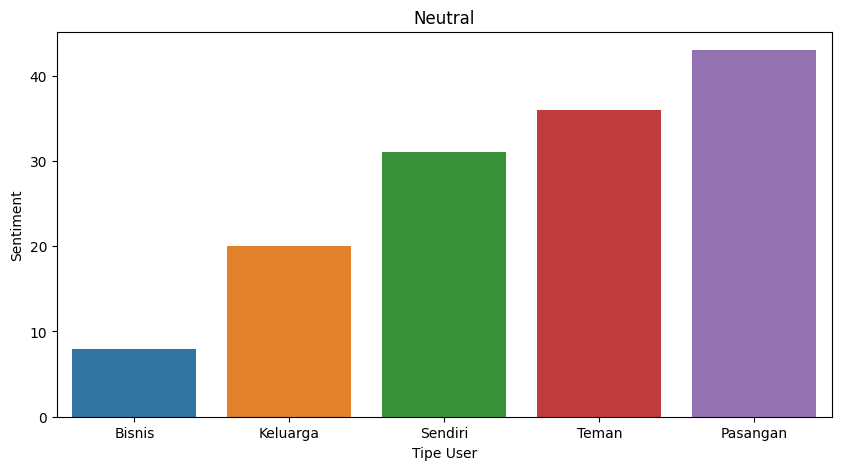

In [242]:
# Neutral
diagnos_plots(net, 'Neutral')

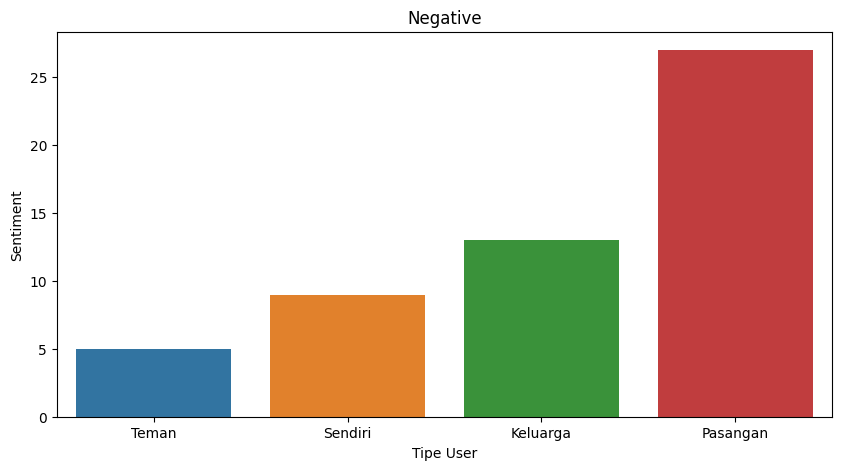

In [243]:
# Negative
diagnos_plots(neg, 'Negative')

In [244]:
# Function to count sentence

def kalimat(data):
  sentences = data.split(".")
  for sentence in sentences:
    total_sentences = len(sentences)
    return total_sentences 



# Function to count words
def kata(data):
  words = data.split()
  for word in words:
    total_words = len(words)
    return total_words

In [245]:
# Check sentences

# Create column 'sentence'
desa_wisata['Sentence'] = desa_wisata['Review'].apply(kalimat)
desa_wisata['Word'] = desa_wisata['Review'].apply(kata)
desa_wisata.head()

,Title,Date,Rating,Review,Desa,Bulan,Tahun,Tipe User,Sentiment,Sentiment_class,Sentence,Word
0,SMILEY FAMILY TOUR,Sep 2018 • Bisnis,5.0,Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat perhiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong,Celuk,Sep,2018,Bisnis,Positif,2,1,26
1,Desa wisata kerajinan emas dan perak,Jan 2018 • Teman,5.0,Tempat yang direkomendasikan bagi yang ini mencari souvenir terbuat dari emas dan perak dengan bentuk dan kualitas beragam. Tempat ini juga dapat terlibat langsung dalam pembuatannya karena dibuka kelas pembuatan souvenir bagi para wisatawan yang berminat,Celuk,Jan,2018,Teman,Positif,2,2,36
2,Desanya Pengrajin emas & Perak,Jul 2016,4.0,"Kami hanya sebentar mengunjungi beberapa pengrajin perak dan emas disini, sayang gak berfoto didalam showroomnya, hanya saat pulang saja... kerajinan perak dan emasnya sangat bagus, saya membeli beberapa .dan pengrajinnya membuat diluar menjadi bahan edukasi untuk anak-anak",Celuk,Jul,2016,Sendiri,Positif,2,5,37
3,Artistic,Jul 2015 • Bisnis,3.0,"Di desa ini kita akan menemui pengrajin perak dengan kreasi mereka yang artistik dan tentunya handmade, detail-detail pernak pernik yang dibuat dengan sangat teliti, sangat bagus untuk jadi oleh-oleh..",Celuk,Jul,2015,Bisnis,Neutral,1,3,29
4,Kampung Seniman Perak,Sep 2015,4.0,"Desa Celuk terletak di Kabupaten Gianyar, berjarak 15 menit dari Pasar Seni Sukawati. Di sini terdapat banyak toko-toko kerajinan perak. Perak yang dijual disini pada umumnya bergaya Bali, atau sedikit modern dari bahan sterling silver. Kita dapat memesan perhiasan emas/perak disini dengan harga yang relatif terjangkau. Layak untuk berbelanja di sini dan menghargai seniman lokal.",Celuk,Sep,2015,Sendiri,Positif,2,6,55


In [246]:

# Function to make wordcloud
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=2000,
        max_font_size=45, 
        scale=1,
        random_state=1
).generate(" ".join(data))

    fig = plt.figure(1, figsize=(40, 30))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.show()

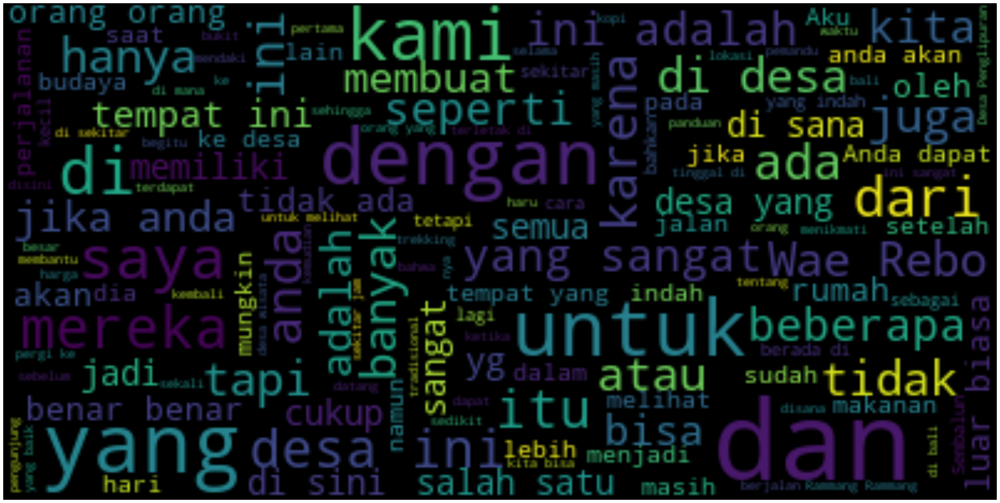

In [247]:
# Positif
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment == 'Positif'].Review.values)

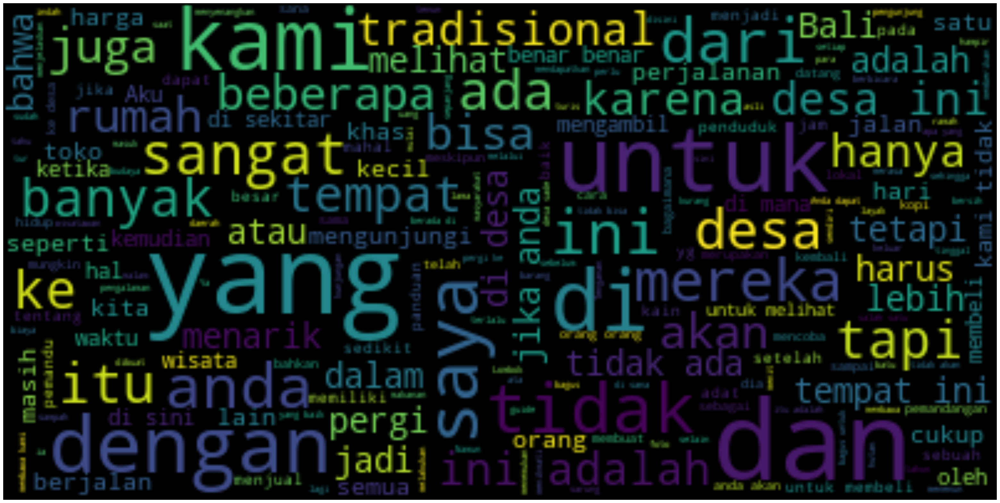

In [248]:
# Neutral
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment_class == 1].Review.values)

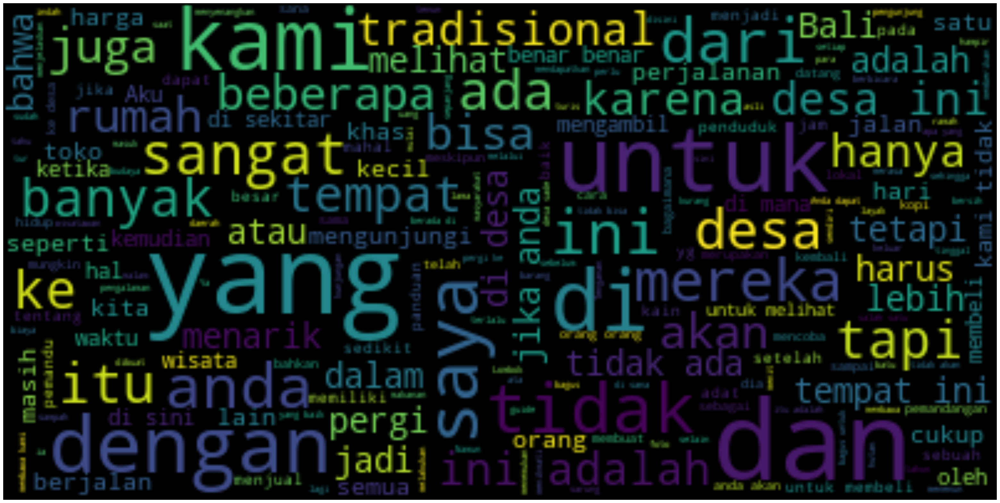

In [249]:
# Negatif
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment_class == 1].Review.values)

# Preprocessing

Pada bagian ini dilakukan preprocessing pada column reviews diantaranya menghilangkan angka, tanda baca, whitespace, stemming, lemma, vectorized, embeding, dan terakhir pipeline tensor flow.

In [250]:
print(desa_wisata['Review'][0])

Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat perhiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong


In [251]:

# Define Stopwords

## Load Stopwords from NLTK
nltk.download('stopwords')
nltk.download('punkt')

stw_id = stopwords.words("indonesian")

## Create A New Stopwords
stw_new = ['orang','desa', 'jam', 'wae', 'rebo', 'bali', 'yg', 'bali ', 'rammang', 'jawa', 'celuk','kasongan', 'penglipuran',
           'sade','sembalun','sukarara','tenangan', 'tomok', 'rammang ', 'jawa ', 'celuk ','kasongan ', 'penglipuran ',
           'sade ','sembalun ','sukarara ','tenangan ', 'tomok ', 'lombok', 'lombok ', 'salah satu', 'salah satu ']


stw_id = stw_id + stw_new
stw_id = list(set(stw_id))
print('Out Final Stopwords')
print(len(stw_id), stw_id)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Hana\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Hana\AppData\Roaming\nltk_data...


Out Final Stopwords
789 ['seorang', 'memintakan', 'lombok ', 'mengibaratkan', 'dalam', 'cukup', 'katanya', 'sela', 'tiga', 'diperbuat', 'kitalah', 'diinginkan', 'pertama-tama', 'sendirinya', 'diketahui', 'menghendaki', 'berapalah', 'sehingga', 'usai', 'semisalnya', 'sedemikian', 'awalnya', 'menyeluruh', 'sepertinya', 'mengucapkan', 'bertanya-tanya', 'hanya', 'semampunya', 'wah', 'tomok ', 'berikutnya', 'ditanyai', 'suatu', 'mau', 'tahun', 'dimaksudnya', 'wahai', 'berjumlah', 'menunjuknya', 'hendaklah', 'agak', 'mengenai', 'hendaknya', 'kapankah', 'mula', 'nyatanya', 'beginian', 'begitukah', 'pada', 'waktunya', 'khususnya', 'akhir', 'adalah', 'menjadi', 'inilah', 'meyakinkan', 'se', 'sebaik', 'jelaslah', 'keluar', 'yakin', 'antar', 'terlihat', 'sebutnya', 'jumlahnya', 'saja', 'kini', 'masing', 'celuk ', 'kemudian', 'kata', 'sampaikan', 'sebetulnya', 'sekurang-kurangnya', 'tepat', 'belakangan', 'asalkan', 'dimulainya', 'sama', 'celuk', 'jumlah', 'nyaris', 'caranya', 'menyangkut', 'bagaim

[nltk_data]   Package punkt is already up-to-date!


In [252]:


# Define Stopwords sastrawi

## Load Stopwords from Sastrawi

sastrawi_id = StopWordRemoverFactory()
stw_new = ['orang','desa']

data = sastrawi_id.get_stop_words()+stw_new
stopword = sastrawi_id.create_stop_word_remover()


print('Out Final Stopwords')
print( len(data),data)


Out Final Stopwords
128 ['yang', 'untuk', 'pada', 'ke', 'para', 'namun', 'menurut', 'antara', 'dia', 'dua', 'ia', 'seperti', 'jika', 'jika', 'sehingga', 'kembali', 'dan', 'tidak', 'ini', 'karena', 'kepada', 'oleh', 'saat', 'harus', 'sementara', 'setelah', 'belum', 'kami', 'sekitar', 'bagi', 'serta', 'di', 'dari', 'telah', 'sebagai', 'masih', 'hal', 'ketika', 'adalah', 'itu', 'dalam', 'bisa', 'bahwa', 'atau', 'hanya', 'kita', 'dengan', 'akan', 'juga', 'ada', 'mereka', 'sudah', 'saya', 'terhadap', 'secara', 'agar', 'lain', 'anda', 'begitu', 'mengapa', 'kenapa', 'yaitu', 'yakni', 'daripada', 'itulah', 'lagi', 'maka', 'tentang', 'demi', 'dimana', 'kemana', 'pula', 'sambil', 'sebelum', 'sesudah', 'supaya', 'guna', 'kah', 'pun', 'sampai', 'sedangkan', 'selagi', 'sementara', 'tetapi', 'apakah', 'kecuali', 'sebab', 'selain', 'seolah', 'seraya', 'seterusnya', 'tanpa', 'agak', 'boleh', 'dapat', 'dsb', 'dst', 'dll', 'dahulu', 'dulunya', 'anu', 'demikian', 'tapi', 'ingin', 'juga', 'nggak', 'mari',

In [253]:
# Membuat Function untuk preprocessing kata dalam dataframe


def text_proses(teks):
  # Mengubah Teks ke Lowercase
  teks = teks.lower()
  
  # Menghilangkan Mention
  teks = re.sub("@[A-Za-z0-9_]+", " ", teks)
  
  # Menghilangkan Hashtag
  teks = re.sub("#[A-Za-z0-9_]+", " ", teks)
  
  # Menghilangkan \n
  teks = re.sub(r"\n", " ",teks)
  
  # Menghilangkan Whitespace
  teks = teks.strip()


  # Menghilangkan Link
  teks = re.sub(r"http\S+", " ", teks)
  teks = re.sub(r"www.\S+", " ", teks)

  # Menghilangkan yang Bukan Huruf seperti Emoji, Simbol Matematika (seperti μ), dst
  teks = re.sub("[^A-Za-z\s']", " ", teks)

  # Melakukan Tokenisasi
  tokens = word_tokenize(teks)

  # Menghilangkan Stopwords
  teks = ' '.join([word for word in tokens if word not in stw_id])

  return teks

In [254]:
# Membuat Function untuk preprocessing kata dalam dataframe


def text_proses1(teks):
  # Mengubah Teks ke Lowercase
  teks = teks.lower()
  
  # Menghilangkan Mention
  teks = re.sub("@[A-Za-z0-9_]+", " ", teks)
  
  # Menghilangkan Hashtag
  teks = re.sub("#[A-Za-z0-9_]+", " ", teks)
  
  # Menghilangkan \n
  teks = re.sub(r"\n", " ",teks)
  
  # Menghilangkan Whitespace
  teks = teks.strip()


  # Menghilangkan Link
  teks = re.sub(r"http\S+", " ", teks)
  teks = re.sub(r"www.\S+", " ", teks)

  # Menghilangkan yang Bukan Huruf seperti Emoji, Simbol Matematika (seperti μ), dst
  teks = re.sub("[^A-Za-z\s']", " ", teks)

  # Melakukan Tokenisasi
  tokens = word_tokenize(teks)

  # Menghilangkan Stopwords
  teks = ' '.join([word for word in tokens if word not in data])

  return teks

In [255]:


# Function lemmatizer
def lemmatize_text(texts):
  sentence = []
  for word in texts.split():
    lemmatizer = WordNetLemmatizer()
    sentence.append(lemmatizer.lemmatize(word, 'v'))
  return ' '.join(sentence)


In [256]:

# Mengaplikasikan Semua Teknik Preprocessing ke dalam Semua Documents

desa_wisata['text_processed'] = desa_wisata.Review.apply(text_proses)
desa_wisata
     

,Title,Date,Rating,Review,Desa,Bulan,Tahun,Tipe User,Sentiment,Sentiment_class,Sentence,Word,text_processed
0,SMILEY FAMILY TOUR,Sep 2018 • Bisnis,5.0,Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat perhiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong,Celuk,Sep,2018,Bisnis,Positif,2,1,26,terkesan lokal perhiasan perak menyaksikan pertunjukan tari barong
1,Desa wisata kerajinan emas dan perak,Jan 2018 • Teman,5.0,Tempat yang direkomendasikan bagi yang ini mencari souvenir terbuat dari emas dan perak dengan bentuk dan kualitas beragam. Tempat ini juga dapat terlibat langsung dalam pembuatannya karena dibuka kelas pembuatan souvenir bagi para wisatawan yang berminat,Celuk,Jan,2018,Teman,Positif,2,2,36,direkomendasikan mencari souvenir terbuat emas perak bentuk kualitas beragam terlibat langsung pembuatannya dibuka kelas pembuatan souvenir wisatawan berminat
2,Desanya Pengrajin emas & Perak,Jul 2016,4.0,"Kami hanya sebentar mengunjungi beberapa pengrajin perak dan emas disini, sayang gak berfoto didalam showroomnya, hanya saat pulang saja... kerajinan perak dan emasnya sangat bagus, saya membeli beberapa .dan pengrajinnya membuat diluar menjadi bahan edukasi untuk anak-anak",Celuk,Jul,2016,Sendiri,Positif,2,5,37,sebentar mengunjungi pengrajin perak emas sayang gak berfoto didalam showroomnya pulang kerajinan perak emasnya bagus membeli pengrajinnya diluar bahan edukasi anak anak
3,Artistic,Jul 2015 • Bisnis,3.0,"Di desa ini kita akan menemui pengrajin perak dengan kreasi mereka yang artistik dan tentunya handmade, detail-detail pernak pernik yang dibuat dengan sangat teliti, sangat bagus untuk jadi oleh-oleh..",Celuk,Jul,2015,Bisnis,Neutral,1,3,29,menemui pengrajin perak kreasi artistik handmade detail detail pernak pernik teliti bagus
4,Kampung Seniman Perak,Sep 2015,4.0,"Desa Celuk terletak di Kabupaten Gianyar, berjarak 15 menit dari Pasar Seni Sukawati. Di sini terdapat banyak toko-toko kerajinan perak. Perak yang dijual disini pada umumnya bergaya Bali, atau sedikit modern dari bahan sterling silver. Kita dapat memesan perhiasan emas/perak disini dengan harga yang relatif terjangkau. Layak untuk berbelanja di sini dan menghargai seniman lokal.",Celuk,Sep,2015,Sendiri,Positif,2,6,55,terletak kabupaten gianyar berjarak menit pasar seni sukawati toko toko kerajinan perak perak dijual bergaya modern bahan sterling silver memesan perhiasan emas perak harga relatif terjangkau layak berbelanja menghargai seniman lokal
...,...,...,...,...,...,...,...,...,...,...,...,...,...
965,Ajaib village...,Jan 2018,4.0,"Saya pergi ke sana dengan teman-teman saya... sudah beberapa lama saya telah hiking... tapi setelah anda akan sampai di desa... anda akan takjub dengan pemandangan... mereka memiliki unik house, itu tampak sangat kecil dari luar tetapi ketika anda berada di dalam rumah benar-benar luas... cukup besar saya pikir... desa sangat welcome dengan turis... tapi saya mendapatkan memengkalkan dengan anak-anak mereka, di bagaimanapun mereka minta permen sangat sering... leader dari pemandu wisata kami mengatakan jika anda ingin memberi sesuatu tolong berikan ke 'ibu-ibu' yang menyiapkan akomodasi kami karena jika kami memberikan langsung ke anak-anak kemudian setiap kali ada tourist anak-anak akan berpikir mereka dapat meminta turis dan kami (turis) mengajar mereka untuk meminta... tapi sisi bahwa saya telah benar-benar hebat waktu di sana... pemandangan yang bagus... cuaca baik...",Waerebo,Jan,2018,Sendiri,Positif,2,37,127,pergi teman teman hiking takjub pemandangan memiliki unik house rumah luas pikir welcome turis memengkalkan anak anak permen leader pemandu wisata tolong 'ibu ' akomodasi langsung anak anak kali tourist anak anak berpikir turis turis mengajar sisi hebat pemandangan bagus cuaca
966,Unik tapi terbatas pengalaman budaya,Nov 2014 • Sendiri,3.0,"Pertama-tama tempat ini cukup sulit. Saya adalah pada sepeda motor dan datang dari Lembor. Jalan untuk Dintor benar-ben

In [257]:
# Mengaplikasikan Semua Teknik Preprocessing ke dalam Semua Documents

desa_wisata['text_processed2'] = desa_wisata.Review.apply(text_proses1)
desa_wisata

,Title,Date,Rating,Review,Desa,Bulan,Tahun,Tipe User,Sentiment,Sentiment_class,Sentence,Word,text_processed,text_processed2
0,SMILEY FAMILY TOUR,Sep 2018 • Bisnis,5.0,Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat perhiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong,Celuk,Sep,2018,Bisnis,Positif,2,1,26,terkesan lokal perhiasan perak menyaksikan pertunjukan tari barong,sangat terkesan melihat lokal celuk membuat perhiasan perak dekat menyaksikan pertunjukan tari barong
1,Desa wisata kerajinan emas dan perak,Jan 2018 • Teman,5.0,Tempat yang direkomendasikan bagi yang ini mencari souvenir terbuat dari emas dan perak dengan bentuk dan kualitas beragam. Tempat ini juga dapat terlibat langsung dalam pembuatannya karena dibuka kelas pembuatan souvenir bagi para wisatawan yang berminat,Celuk,Jan,2018,Teman,Positif,2,2,36,direkomendasikan mencari souvenir terbuat emas perak bentuk kualitas beragam terlibat langsung pembuatannya dibuka kelas pembuatan souvenir wisatawan berminat,tempat direkomendasikan mencari souvenir terbuat emas perak bentuk kualitas beragam tempat terlibat langsung pembuatannya dibuka kelas pembuatan souvenir wisatawan berminat
2,Desanya Pengrajin emas & Perak,Jul 2016,4.0,"Kami hanya sebentar mengunjungi beberapa pengrajin perak dan emas disini, sayang gak berfoto didalam showroomnya, hanya saat pulang saja... kerajinan perak dan emasnya sangat bagus, saya membeli beberapa .dan pengrajinnya membuat diluar menjadi bahan edukasi untuk anak-anak",Celuk,Jul,2016,Sendiri,Positif,2,5,37,sebentar mengunjungi pengrajin perak emas sayang gak berfoto didalam showroomnya pulang kerajinan perak emasnya bagus membeli pengrajinnya diluar bahan edukasi anak anak,sebentar mengunjungi beberapa pengrajin perak emas disini sayang gak berfoto didalam showroomnya pulang kerajinan perak emasnya sangat bagus membeli beberapa pengrajinnya membuat diluar menjadi bahan edukasi anak anak
3,Artistic,Jul 2015 • Bisnis,3.0,"Di desa ini kita akan menemui pengrajin perak dengan kreasi mereka yang artistik dan tentunya handmade, detail-detail pernak pernik yang dibuat dengan sangat teliti, sangat bagus untuk jadi oleh-oleh..",Celuk,Jul,2015,Bisnis,Neutral,1,3,29,menemui pengrajin perak kreasi artistik handmade detail detail pernak pernik teliti bagus,menemui pengrajin perak kreasi artistik tentunya handmade detail detail pernak pernik dibuat sangat teliti sangat bagus jadi
4,Kampung Seniman Perak,Sep 2015,4.0,"Desa Celuk terletak di Kabupaten Gianyar, berjarak 15 menit dari Pasar Seni Sukawati. Di sini terdapat banyak toko-toko kerajinan perak. Perak yang dijual disini pada umumnya bergaya Bali, atau sedikit modern dari bahan sterling silver. Kita dapat memesan perhiasan emas/perak disini dengan harga yang relatif terjangkau. Layak untuk berbelanja di sini dan menghargai seniman lokal.",Celuk,Sep,2015,Sendiri,Positif,2,6,55,terletak kabupaten gianyar berjarak menit pasar seni sukawati toko toko kerajinan perak perak dijual bergaya modern bahan sterling silver memesan perhiasan emas perak harga relatif terjangkau layak berbelanja menghargai seniman lokal,celuk terletak kabupaten gianyar berjarak menit pasar seni sukawati sini terdapat banyak toko toko kerajinan perak perak dijual disini umumnya bergaya bali sedikit modern bahan sterling silver memesan perhiasan emas perak disini harga relatif terjangkau layak berbelanja sini menghargai seniman lokal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
965,Ajaib village...,Jan 2018,4.0,"Saya pergi ke sana dengan teman-teman saya... sudah beberapa lama saya telah hiking... tapi setelah anda akan sampai di desa... anda akan takjub dengan pemandangan... mereka memiliki unik house, itu tampak sangat kecil dari luar tetapi ketika anda berada di dalam rumah benar-benar luas... cukup besar saya pikir... desa sangat welcome dengan turis... tapi saya mendapatkan memengkalkan dengan anak-anak mereka, di bagaimanapun mereka minta permen san

In [258]:
print('original \n' , desa_wisata.Review[0])
print('NLTK \n' , desa_wisata.text_processed[0])
print('sastrawi \n' , desa_wisata.text_processed2[0])

original 
 Saya sangat terkesan begitu melihat orang lokal di Desa Celuk membuat perhiasan dari perak dan di dekat desa ini saya juga bisa menyaksikan pertunjukan tari Barong
NLTK 
 terkesan lokal perhiasan perak menyaksikan pertunjukan tari barong
sastrawi 
 sangat terkesan melihat lokal celuk membuat perhiasan perak dekat menyaksikan pertunjukan tari barong


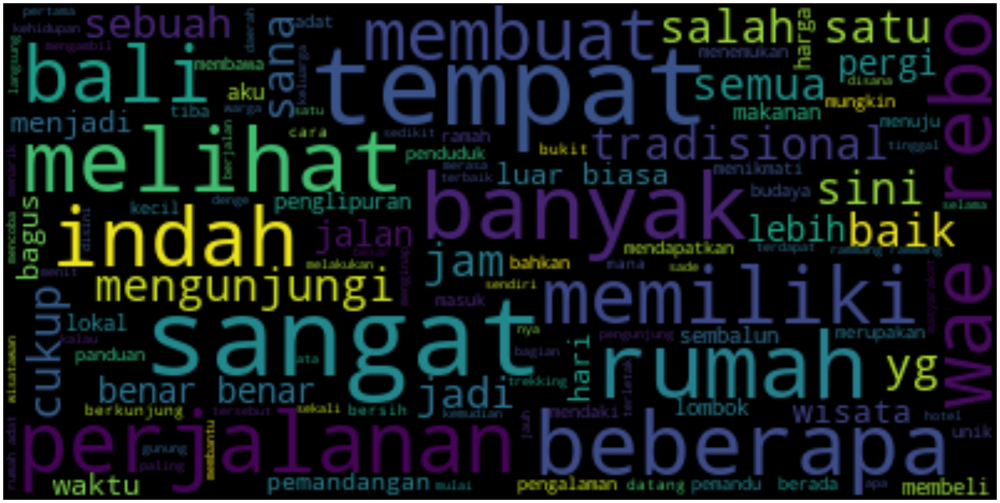

In [259]:
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment_class == 2].text_processed2.values)

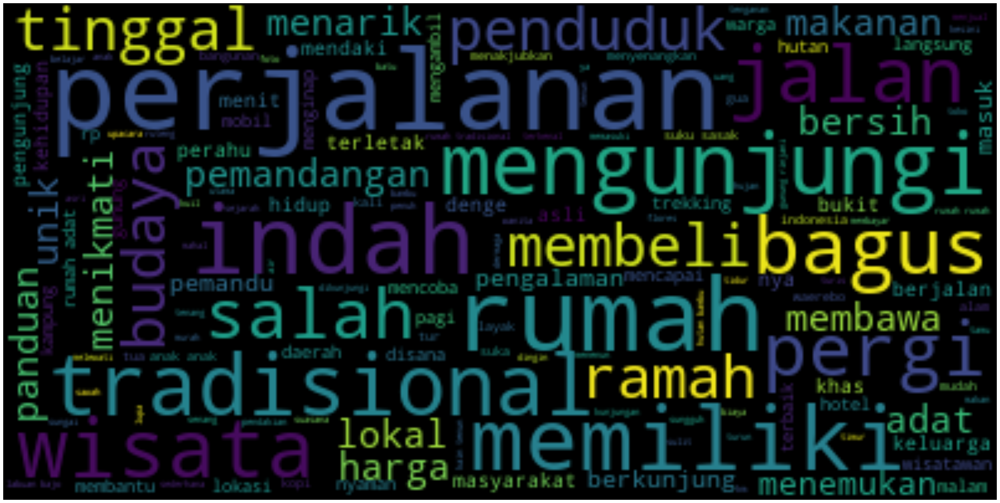

In [260]:
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment_class == 2].text_processed.values)

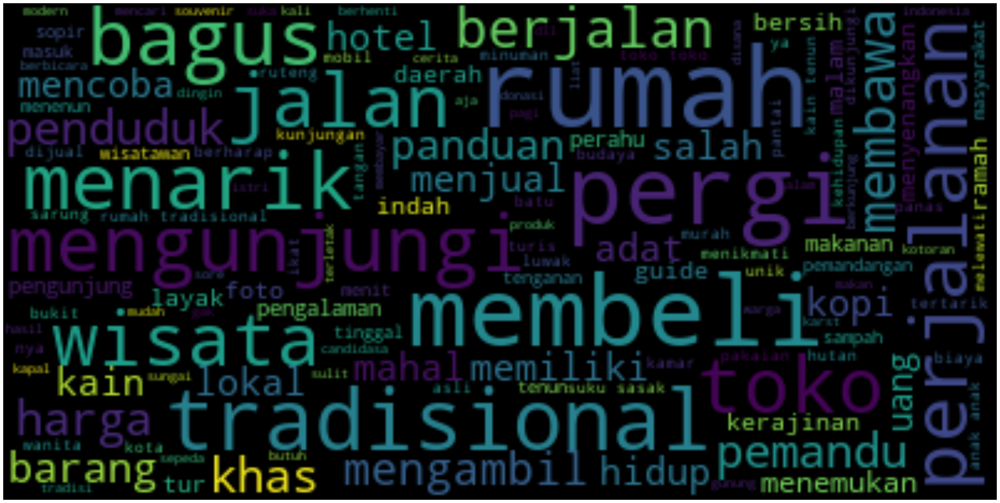

In [261]:
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment_class == 1].text_processed.values)

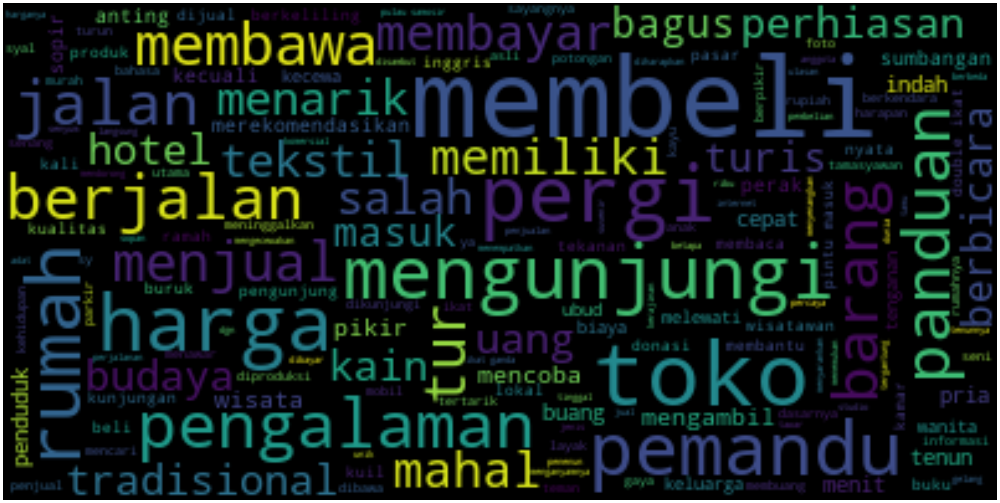

In [262]:
show_wordcloud(desa_wisata.loc[desa_wisata.Sentiment_class == 0].text_processed.values)

In [263]:
# most words in text
def get_corpus(text):
    words = []
    for i in text:
        for j in i.split():
            words.append(j.strip())
    return words
corpus1 = get_corpus(desa_wisata.text_processed)
corpus2 = get_corpus(desa_wisata.loc[desa_wisata.Sentiment_class == 2].text_processed)
corpus3 = get_corpus(desa_wisata.loc[desa_wisata.Sentiment_class == 1].text_processed)
corpus4 = get_corpus(desa_wisata.loc[desa_wisata.Sentiment_class == 0].text_processed)
corpus1[:5]

['terkesan', 'lokal', 'perhiasan', 'perak', 'menyaksikan']

In [264]:
def count_words(text):
    most_common = []
    counter = Counter(text)
    most_common = counter.most_common(30)
    most_common = dict(most_common)
    return most_common

In [265]:
# get the most common word positive sentiment
positive = count_words(corpus2)
positive

{'rumah': 458,
 'perjalanan': 284,
 'tradisional': 229,
 'indah': 228,
 'jalan': 213,
 'wisata': 189,
 'memiliki': 167,
 'adat': 166,
 'mengunjungi': 156,
 'penduduk': 156,
 'pemandangan': 153,
 'salah': 141,
 'ramah': 139,
 'bagus': 134,
 'lokal': 133,
 'anak': 126,
 'masuk': 126,
 'pergi': 121,
 'budaya': 121,
 'bukit': 120,
 'bersih': 116,
 'malam': 115,
 'tinggal': 113,
 'harga': 110,
 'membeli': 109,
 'makanan': 103,
 'berjalan': 100,
 'pemandu': 100,
 'membawa': 100,
 'unik': 97}

In [266]:
keysList = list(positive.keys())
valList = list(positive.values())
Positive = pd.DataFrame(list(zip(keysList, valList)), columns=['Word','Qty'])
Positive

,Word,Qty
0,rumah,458
1,perjalanan,284
2,tradisional,229
3,indah,228
4,jalan,213
5,wisata,189
6,memiliki,167
7,adat,166
8,mengunjungi,156
9,penduduk,156


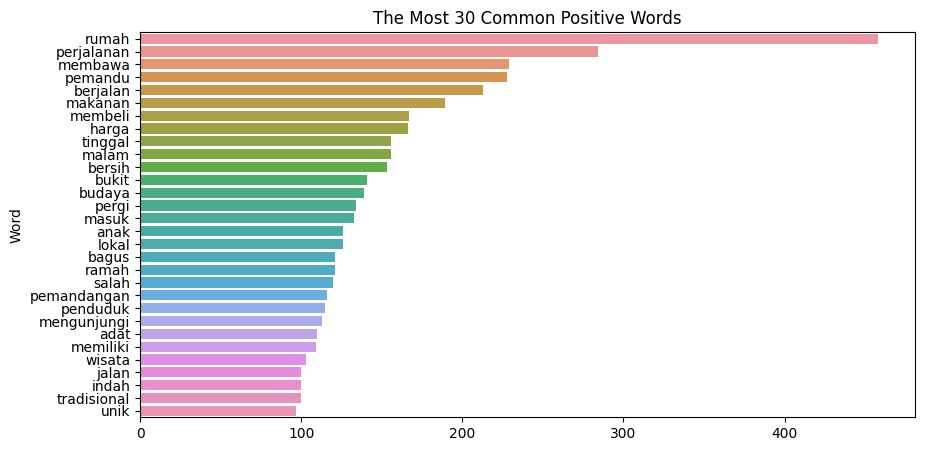

In [267]:
# Check barplot sentimen

fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(y=Positive['Word'].value_counts().index, x=Positive['Qty'].values, orient='h')
#plt.xticks(rotation='vertical')
plt.title('The Most 30 Common Positive Words')
plt.show()


In [268]:
pd.set_option('display.max_colwidth', None)

In [269]:
desa_wisata[(desa_wisata.Sentiment =='Negatif')&(desa_wisata.Review.str.contains('salah'))].Review

22                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [270]:
# get the most common word neutral sentiment
neutral = count_words(corpus3)
neutral

{'rumah': 74,
 'membeli': 49,
 'toko': 47,
 'tradisional': 46,
 'pergi': 45,
 'bagus': 31,
 'menarik': 31,
 'berjalan': 31,
 'mengunjungi': 29,
 'perjalanan': 29,
 'kain': 28,
 'jalan': 27,
 'wisata': 27,
 'harga': 26,
 'membawa': 24,
 'penduduk': 24,
 'khas': 23,
 'pemandu': 22,
 'mengambil': 21,
 'masuk': 21,
 'barang': 19,
 'indah': 19,
 'panduan': 19,
 'menjual': 19,
 'anak': 19,
 'tenun': 19,
 'memiliki': 18,
 'adat': 18,
 'salah': 17,
 'mahal': 17}

In [271]:
keysList = list(neutral.keys())
valList = list(neutral.values())
netral = pd.DataFrame(list(zip(keysList, valList)), columns=['Word','Qty'])
netral

,Word,Qty
0,rumah,74
1,membeli,49
2,toko,47
3,tradisional,46
4,pergi,45
5,bagus,31
6,menarik,31
7,berjalan,31
8,mengunjungi,29
9,perjalanan,29


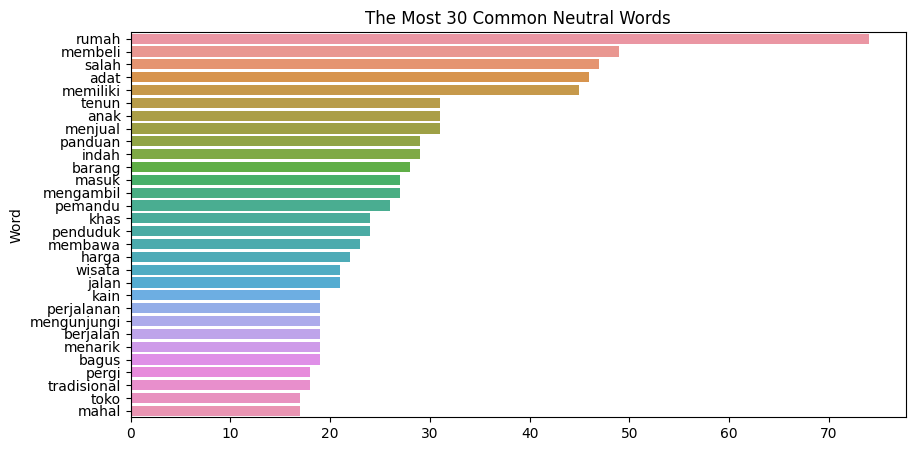

In [272]:
# Check barplot sentimen

fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(y=netral['Word'].value_counts().index, x=netral['Qty'].values, orient='h')
#plt.xticks(rotation='vertical')
plt.title('The Most 30 Common Neutral Words')
plt.show()

In [273]:
# get the most common word negative sentiment
negative = count_words(corpus4)
negative

{'membeli': 55,
 'toko': 32,
 'pergi': 25,
 'harga': 25,
 'mengunjungi': 22,
 'pemandu': 22,
 'rumah': 22,
 'pengalaman': 18,
 'panduan': 17,
 'barang': 16,
 'berjalan': 16,
 'jalan': 16,
 'membawa': 15,
 'masuk': 15,
 'tur': 14,
 'menjual': 14,
 'membayar': 13,
 'mahal': 13,
 'memiliki': 13,
 'menarik': 12,
 'tekstil': 12,
 'salah': 12,
 'perhiasan': 11,
 'uang': 11,
 'hotel': 11,
 'tradisional': 11,
 'budaya': 11,
 'kain': 11,
 'turis': 10,
 'bagus': 10}

In [274]:
keysList = list(negative.keys())
valList = list(negative.values())
Negative = pd.DataFrame(list(zip(keysList, valList)), columns=['Word','Qty'])
Negative

,Word,Qty
0,membeli,55
1,toko,32
2,pergi,25
3,harga,25
4,mengunjungi,22
5,pemandu,22
6,rumah,22
7,pengalaman,18
8,panduan,17
9,barang,16


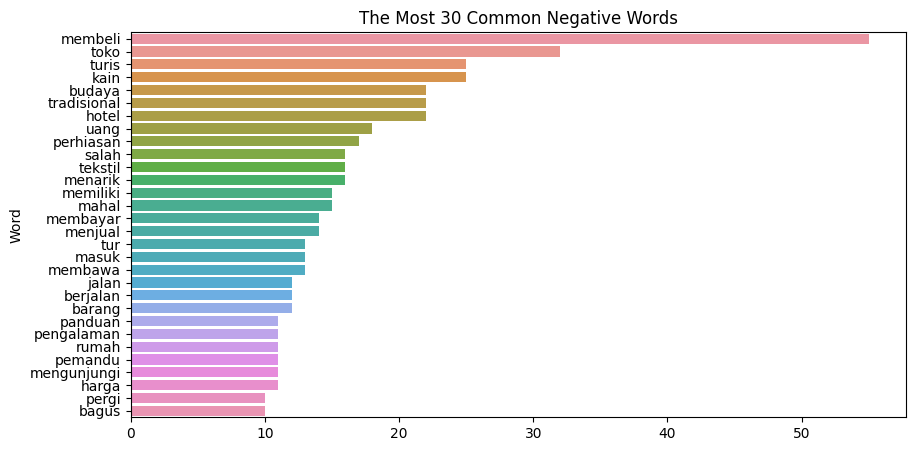

In [275]:
# Check barplot sentimen

fig, ax=plt.subplots(figsize=(10,5))
sns.barplot(y=Negative['Word'].value_counts().index, x=Negative['Qty'].values, orient='h')
#plt.xticks(rotation='vertical')
plt.title('The Most 30 Common Negative Words')
plt.show()

In [276]:
desa_wisata.loc[desa_wisata.Sentiment_class == 2].text_processed

0                                                                                                                                                                                                                                                                                                                                                                                  terkesan lokal perhiasan perak menyaksikan pertunjukan tari barong
1                                                                                                                                                                                                                                                                                      direkomendasikan mencari souvenir terbuat emas perak bentuk kualitas beragam terlibat langsung pembuatannya dibuka kelas pembuatan souvenir wisatawan berminat
2                                                                                                                           

In [277]:
desa_wisata.loc[desa_wisata.Sentiment_class == 2].text_processed

0                                                                                                                                                                                                                                                                                                                                                                                  terkesan lokal perhiasan perak menyaksikan pertunjukan tari barong
1                                                                                                                                                                                                                                                                                      direkomendasikan mencari souvenir terbuat emas perak bentuk kualitas beragam terlibat langsung pembuatannya dibuka kelas pembuatan souvenir wisatawan berminat
2                                                                                                                           